In [1]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

from torchvision.utils import save_image
from PIL import Image
import pickle

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [2]:
from torch.utils.data import Dataset
from torchvision import transforms
from torch.utils.data import DataLoader


class LogoDataset(Dataset):

    def __init__(self, data, transform=None):
        self.img = data
        self.transform = transform

    def __len__(self):
        return len(self.img)

    def __getitem__(self, idx):
        
        PIL_ = Image.fromarray(self.img[idx])

        if self.transform:
            image = self.transform(PIL_)

        return image


In [3]:
# Root directory for dataset
dataroot = "./LLD-icon_full"
filelist=os.listdir(dataroot)
loaded_list = []

for f in filelist:
    with open(dataroot + "/" + f, 'rb') as file:
        pickle_loaded = pickle.load(file, encoding='bytes')
        loaded_list = pickle_loaded if (len(loaded_list) == 0) else np.concatenate((loaded_list, pickle_loaded))

print('shape of loaded_list ', end='')
print(loaded_list.shape)
            

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128 

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 32

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 32

# Size of feature maps in discriminator
ndf = 32

# Number of training epochs
num_epochs = 10

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

shape of loaded_list (548210, 32, 32, 3)


In [4]:
if not torch.cuda.is_available():
    print("CUDA NOT FOUND!")

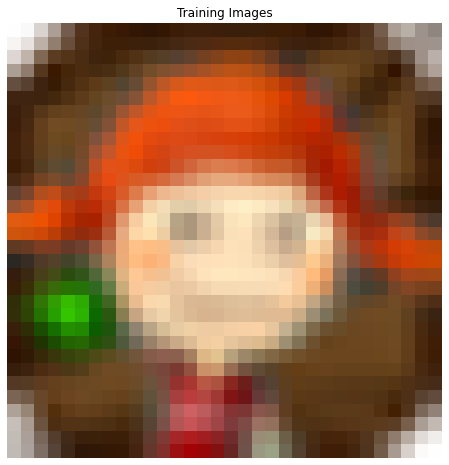

In [5]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset = LogoDataset(data=loaded_list,
                           transform=transforms.Compose([
#                                transforms.Resize(image_size),
#                                transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:32], padding=2, normalize=True).cpu(),(1,2,0)))

In [6]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [7]:
# # Generator Code

# class Generator(nn.Module):
#     def __init__(self, ngpu):
#         super(Generator, self).__init__()
#         self.ngpu = ngpu
#         self.main = nn.Sequential(
#             # input is Z, going into a convolution
#             nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
#             nn.BatchNorm2d(ngf * 8),
#             nn.ReLU(True),
#             # state size. (ngf*8) x 4 x 4
#             nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ngf * 4),
#             nn.ReLU(True),
#             # state size. (ngf*4) x 8 x 8
#             nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ngf * 2),
#             nn.ReLU(True),
#             # state size. (ngf*2) x 16 x 16
#             nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ngf),
#             nn.ReLU(True),
#             # state size. (ngf) x 32 x 32
#             nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
#             nn.Tanh()
#             # state size. (nc) x 64 x 64
#         )

#     def forward(self, input):
#         return self.main(input)

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            #nn.ConvTranspose2d(ngf * 2,     ngf, 4, 2, 1, bias=False),
            #nn.BatchNorm2d(ngf),
            #nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d(ngf * 2,      nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )
    def forward(self, input):
        return self.main(input)

In [8]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 256, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): Tanh()
  )
)


In [9]:
# class Discriminator(nn.Module):
#     def __init__(self, ngpu):
#         super(Discriminator, self).__init__()
#         self.ngpu = ngpu
#         self.main = nn.Sequential(
#             # input is (nc) x 64 x 64
#             nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
#             nn.LeakyReLU(0.2, inplace=True),
#             # state size. (ndf) x 32 x 32
#             nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ndf * 2),
#             nn.LeakyReLU(0.2, inplace=True),
#             # state size. (ndf*2) x 16 x 16
#             nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ndf * 4),
#             nn.LeakyReLU(0.2, inplace=True),
#             # state size. (ndf*4) x 8 x 8
#             nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
#             nn.BatchNorm2d(ndf * 8),
#             nn.LeakyReLU(0.2, inplace=True),
#             # state size. (ndf*8) x 4 x 4
#             nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
#             nn.Sigmoid()
#         )

#     def forward(self, input):
#         return self.main(input)


class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 2, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [10]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(256, 1, kernel_size=(2, 2), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [11]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(32, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1
fake_label = 0

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

In [12]:
# Training Loop

# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data.to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Add the gradients from the all-real and all-fake batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1


Starting Training Loop...


/pytorch/aten/src/ATen/native/TensorFactories.cpp:361: UserWarning: Deprecation warning: In a future PyTorch release torch.full will no longer return tensors of floating dtype by default. Instead, a bool fill_value will return a tensor of torch.bool dtype, and an integral fill_value will return a tensor of torch.long dtype. Set the optional `dtype` or `out` arguments to suppress this warning.


[0/5][0/4283]	Loss_D: 1.5055	Loss_G: 1.0377	D(x): 0.4766	D(G(z)): 0.5156 / 0.3644
[0/5][50/4283]	Loss_D: 0.3024	Loss_G: 4.2291	D(x): 0.7948	D(G(z)): 0.0477 / 0.0167
[0/5][100/4283]	Loss_D: 0.6779	Loss_G: 2.3339	D(x): 0.7380	D(G(z)): 0.2841 / 0.1066
[0/5][150/4283]	Loss_D: 0.5990	Loss_G: 2.7894	D(x): 0.8227	D(G(z)): 0.2992 / 0.0784
[0/5][200/4283]	Loss_D: 0.4864	Loss_G: 2.4507	D(x): 0.8308	D(G(z)): 0.2464 / 0.1002
[0/5][250/4283]	Loss_D: 0.5475	Loss_G: 2.3782	D(x): 0.6273	D(G(z)): 0.0171 / 0.1167
[0/5][300/4283]	Loss_D: 0.4752	Loss_G: 3.5659	D(x): 0.8751	D(G(z)): 0.2738 / 0.0321
[0/5][350/4283]	Loss_D: 1.2141	Loss_G: 3.1179	D(x): 0.8456	D(G(z)): 0.5936 / 0.0684
[0/5][400/4283]	Loss_D: 0.9836	Loss_G: 1.7238	D(x): 0.5517	D(G(z)): 0.2682 / 0.1977
[0/5][450/4283]	Loss_D: 1.3692	Loss_G: 1.1894	D(x): 0.4308	D(G(z)): 0.3282 / 0.3388
[0/5][500/4283]	Loss_D: 0.9586	Loss_G: 1.4869	D(x): 0.4804	D(G(z)): 0.1215 / 0.2480
[0/5][550/4283]	Loss_D: 0.4453	Loss_G: 2.2011	D(x): 0.8235	D(G(z)): 0.2080 / 0.

[1/5][550/4283]	Loss_D: 0.3739	Loss_G: 3.0891	D(x): 0.8212	D(G(z)): 0.1430 / 0.0542
[1/5][600/4283]	Loss_D: 1.8349	Loss_G: 5.1715	D(x): 0.9575	D(G(z)): 0.7941 / 0.0080
[1/5][650/4283]	Loss_D: 0.3207	Loss_G: 3.4985	D(x): 0.9209	D(G(z)): 0.1996 / 0.0382
[1/5][700/4283]	Loss_D: 0.5150	Loss_G: 2.4224	D(x): 0.6759	D(G(z)): 0.0816 / 0.1159
[1/5][750/4283]	Loss_D: 0.2459	Loss_G: 2.7815	D(x): 0.8195	D(G(z)): 0.0380 / 0.0787
[1/5][800/4283]	Loss_D: 0.3091	Loss_G: 2.9247	D(x): 0.9048	D(G(z)): 0.1793 / 0.0650
[1/5][850/4283]	Loss_D: 0.4264	Loss_G: 4.3019	D(x): 0.9655	D(G(z)): 0.3053 / 0.0169
[1/5][900/4283]	Loss_D: 0.6435	Loss_G: 0.8909	D(x): 0.6232	D(G(z)): 0.1261 / 0.4448
[1/5][950/4283]	Loss_D: 0.2465	Loss_G: 2.9561	D(x): 0.8270	D(G(z)): 0.0443 / 0.0643
[1/5][1000/4283]	Loss_D: 0.2376	Loss_G: 3.1417	D(x): 0.9122	D(G(z)): 0.1294 / 0.0523
[1/5][1050/4283]	Loss_D: 0.2876	Loss_G: 2.9988	D(x): 0.9251	D(G(z)): 0.1818 / 0.0579
[1/5][1100/4283]	Loss_D: 0.1358	Loss_G: 3.5907	D(x): 0.9807	D(G(z)): 0.106

[2/5][1100/4283]	Loss_D: 0.0327	Loss_G: 5.5798	D(x): 0.9803	D(G(z)): 0.0124 / 0.0048
[2/5][1150/4283]	Loss_D: 0.2822	Loss_G: 3.9438	D(x): 0.9641	D(G(z)): 0.2080 / 0.0241
[2/5][1200/4283]	Loss_D: 0.0867	Loss_G: 5.6493	D(x): 0.9265	D(G(z)): 0.0084 / 0.0063
[2/5][1250/4283]	Loss_D: 0.2196	Loss_G: 4.0706	D(x): 0.9955	D(G(z)): 0.1780 / 0.0232
[2/5][1300/4283]	Loss_D: 0.4091	Loss_G: 4.6823	D(x): 0.6880	D(G(z)): 0.0068 / 0.0133
[2/5][1350/4283]	Loss_D: 0.2030	Loss_G: 2.9115	D(x): 0.8564	D(G(z)): 0.0402 / 0.0716
[2/5][1400/4283]	Loss_D: 0.1113	Loss_G: 3.8186	D(x): 0.9068	D(G(z)): 0.0104 / 0.0303
[2/5][1450/4283]	Loss_D: 0.2433	Loss_G: 2.5474	D(x): 0.8525	D(G(z)): 0.0693 / 0.0990
[2/5][1500/4283]	Loss_D: 0.1180	Loss_G: 4.1378	D(x): 0.9912	D(G(z)): 0.1002 / 0.0199
[2/5][1550/4283]	Loss_D: 0.0880	Loss_G: 3.5420	D(x): 0.9491	D(G(z)): 0.0335 / 0.0408
[2/5][1600/4283]	Loss_D: 0.0937	Loss_G: 3.7179	D(x): 0.9575	D(G(z)): 0.0461 / 0.0352
[2/5][1650/4283]	Loss_D: 0.1118	Loss_G: 5.4964	D(x): 0.9117	D(G(z

[3/5][1650/4283]	Loss_D: 0.0320	Loss_G: 4.8670	D(x): 0.9845	D(G(z)): 0.0156 / 0.0116
[3/5][1700/4283]	Loss_D: 1.1953	Loss_G: 6.7146	D(x): 0.9985	D(G(z)): 0.6380 / 0.0019
[3/5][1750/4283]	Loss_D: 0.4434	Loss_G: 5.1638	D(x): 0.6732	D(G(z)): 0.0016 / 0.0089
[3/5][1800/4283]	Loss_D: 0.1485	Loss_G: 3.2099	D(x): 0.9702	D(G(z)): 0.1030 / 0.0546
[3/5][1850/4283]	Loss_D: 0.0544	Loss_G: 3.9663	D(x): 0.9937	D(G(z)): 0.0452 / 0.0269
[3/5][1900/4283]	Loss_D: 0.0479	Loss_G: 4.3181	D(x): 0.9690	D(G(z)): 0.0157 / 0.0174
[3/5][1950/4283]	Loss_D: 1.8677	Loss_G: 3.6000	D(x): 0.5415	D(G(z)): 0.6284 / 0.0360
[3/5][2000/4283]	Loss_D: 0.6760	Loss_G: 0.9849	D(x): 0.5540	D(G(z)): 0.0162 / 0.4195
[3/5][2050/4283]	Loss_D: 0.1087	Loss_G: 3.6044	D(x): 0.9638	D(G(z)): 0.0669 / 0.0362
[3/5][2100/4283]	Loss_D: 0.0284	Loss_G: 5.5622	D(x): 0.9761	D(G(z)): 0.0040 / 0.0058
[3/5][2150/4283]	Loss_D: 0.1811	Loss_G: 4.5440	D(x): 0.8550	D(G(z)): 0.0070 / 0.0150
[3/5][2200/4283]	Loss_D: 0.1513	Loss_G: 2.7545	D(x): 0.8945	D(G(z

[4/5][2200/4283]	Loss_D: 0.0193	Loss_G: 5.3982	D(x): 0.9897	D(G(z)): 0.0086 / 0.0067
[4/5][2250/4283]	Loss_D: 0.0193	Loss_G: 5.3708	D(x): 0.9931	D(G(z)): 0.0121 / 0.0073
[4/5][2300/4283]	Loss_D: 0.1153	Loss_G: 1.9127	D(x): 0.9899	D(G(z)): 0.0856 / 0.1765
[4/5][2350/4283]	Loss_D: 0.0368	Loss_G: 5.1829	D(x): 0.9797	D(G(z)): 0.0159 / 0.0082
[4/5][2400/4283]	Loss_D: 0.0541	Loss_G: 4.4464	D(x): 0.9856	D(G(z)): 0.0379 / 0.0153
[4/5][2450/4283]	Loss_D: 0.0287	Loss_G: 5.1884	D(x): 0.9845	D(G(z)): 0.0128 / 0.0078
[4/5][2500/4283]	Loss_D: 0.2189	Loss_G: 4.3485	D(x): 0.8812	D(G(z)): 0.0722 / 0.0191
[4/5][2550/4283]	Loss_D: 0.2303	Loss_G: 3.1239	D(x): 0.9913	D(G(z)): 0.1756 / 0.0621
[4/5][2600/4283]	Loss_D: 0.0836	Loss_G: 4.2366	D(x): 0.9316	D(G(z)): 0.0108 / 0.0207
[4/5][2650/4283]	Loss_D: 0.0442	Loss_G: 5.1363	D(x): 0.9664	D(G(z)): 0.0095 / 0.0085
[4/5][2700/4283]	Loss_D: 0.0270	Loss_G: 4.8062	D(x): 0.9929	D(G(z)): 0.0194 / 0.0111
[4/5][2750/4283]	Loss_D: 0.2229	Loss_G: 4.8923	D(x): 0.8180	D(G(z

In [13]:
# save model
torch.save(netG, "model.pth")

/home/NFS/course/mlintro/mlintro2020s/mlintro2020s93/.local/lib/python3.6/site-packages/torch/serialization.py:402: UserWarning: Couldn't retrieve source code for container of type Generator. It won't be checked for correctness upon loading.
  "type " + obj.__name__ + ". It won't be checked "


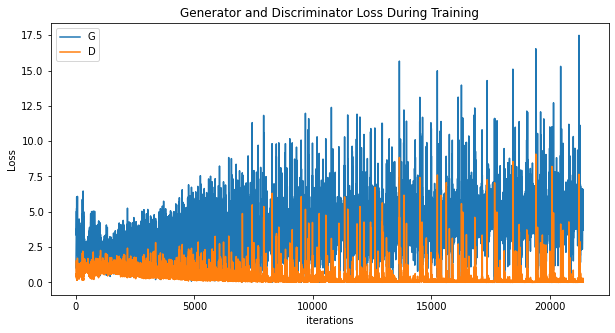

In [14]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

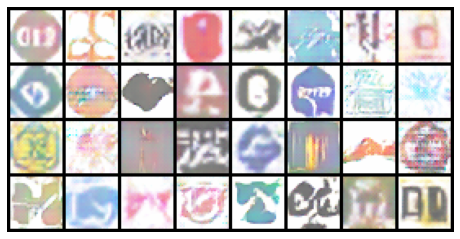

In [15]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

In [16]:
gen_batch = 10000
gen_target = 50000
cnt = 0
for k in range(int(gen_target / gen_batch)):
    gen_noise = torch.randn(gen_batch, nz, 1, 1, device=device)
    fake = netG(gen_noise)
    for i in range(len(fake)):
        save_image(fake[i], "/home/NFS/course/mlintro/mlintro2020s/mlintro2020s93/Lab6/gen_img2/0610101_img/%s.png" %str(gen_batch*k + i))

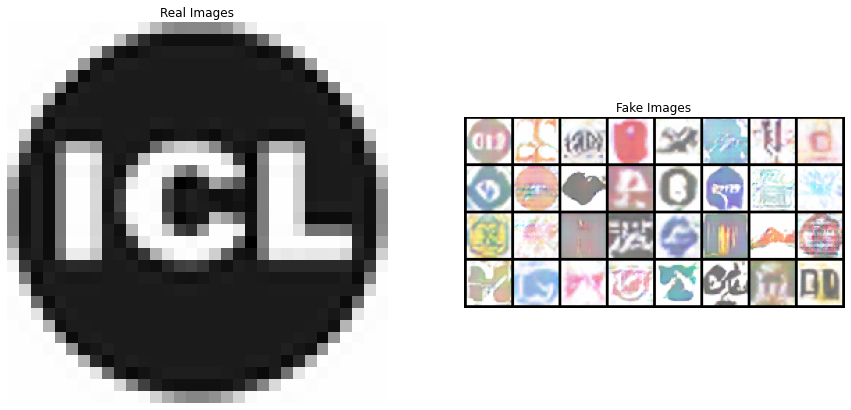

In [17]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:32], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()
